 Adjusted mutual information (AMI) Score
 
 A variation of mutual information may be used for comparing clusterings
 
Adjusted Mutual Information (AMI) is an adjustment of the Mutual Information (MI) score to account for chance. It accounts for the fact that the MI is generally higher for two clusterings with a larger number of clusters, regardless of whether there is actually more information shared

#### modification of file location
move knn_labels_XX.npy to inside of ./labels_knn_2015June/

In [1]:
import os 
import sys
import numpy as np
from sklearn.metrics import adjusted_mutual_info_score as ami

In [2]:
import matplotlib.pyplot as plt

In [4]:
sys.path.insert(1, os.path.join(sys.path[0],"/home/tkurihana/scratch-midway2/data/MOD06/" ) )
from analysis_lib import cluster_plotting2, _cluster_plotting
from analysis_lib import _get_swath, _load_tif_data
from analysis_lib import _get_colors, _gen_patches

### Path to Data-Directory

In [3]:
datadir = '/home/tkurihana/scratch-midway2/anl'

In [5]:
tifdir='/home/tkurihana/scratch-midway2/data/GEE/clouds_gee_2015_2016'

In [6]:
tifname='2015-06-28_MOD09GA_background_removal_zero_inputated_image_with_cf_10perc_grid_size10-0000017664-0000070656.tif'

### Load Swath data

In [7]:
swath1 = _get_swath(tifdir, tifname)

 Shape  (9054, 9496, 7)


In [8]:
SHAPE = 128, 128, 7

In [9]:
patches = _gen_patches(swath1, normalization=True)

In [10]:
colors = _get_colors(n=10)

### Load KNN Data

 
### Scaler : 1/25 ###


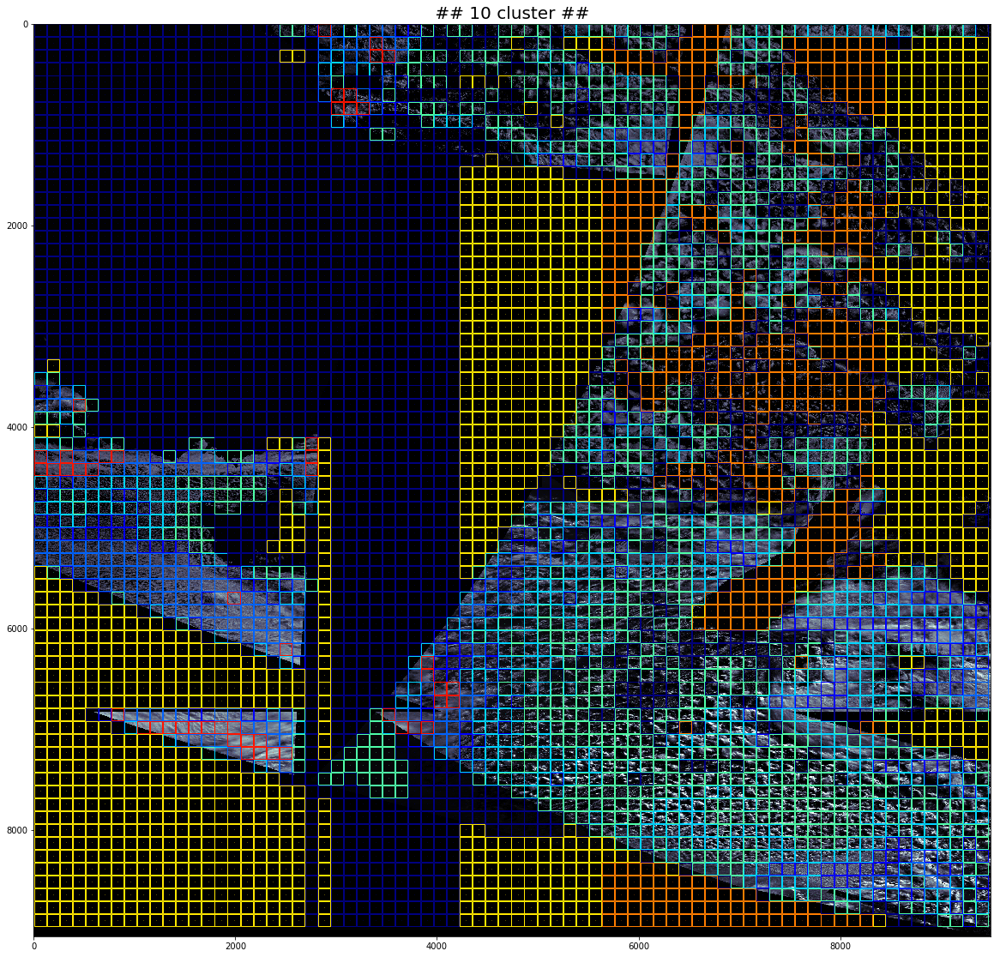

 
### Scaler : 1/30 ###


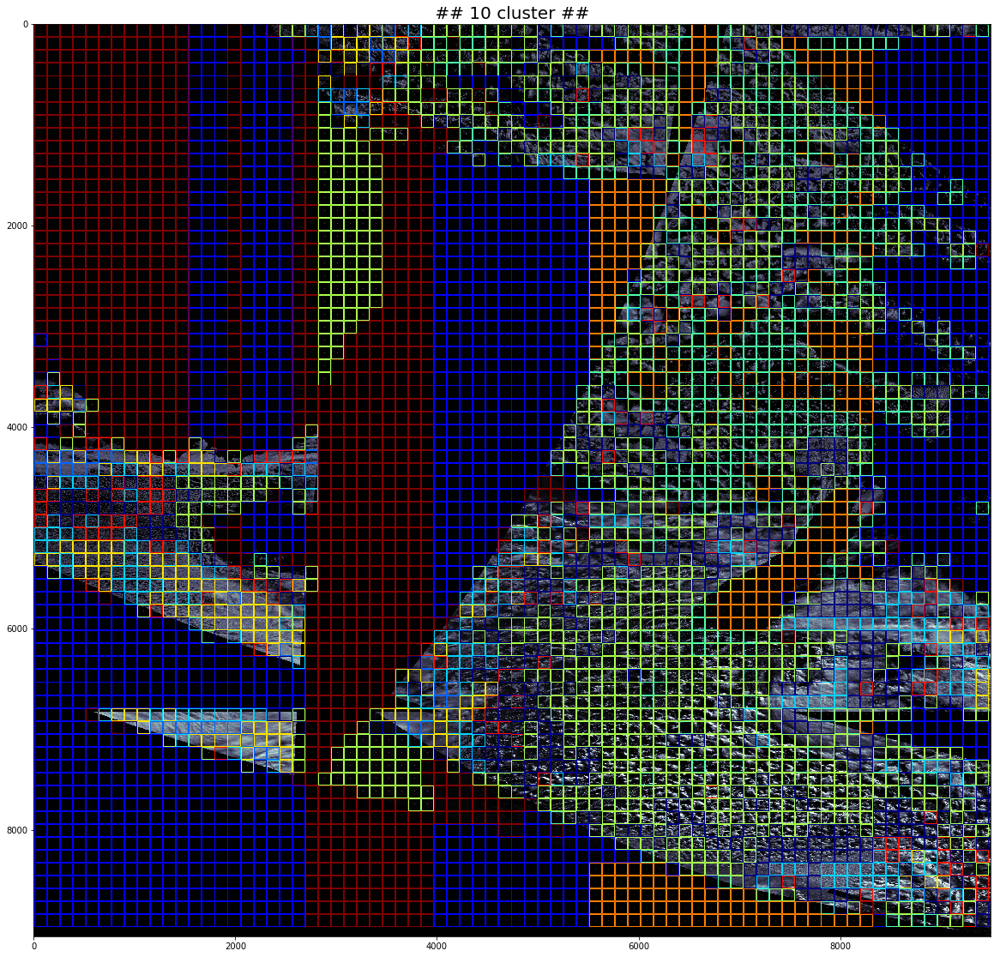

 
### Scaler : 1/35 ###


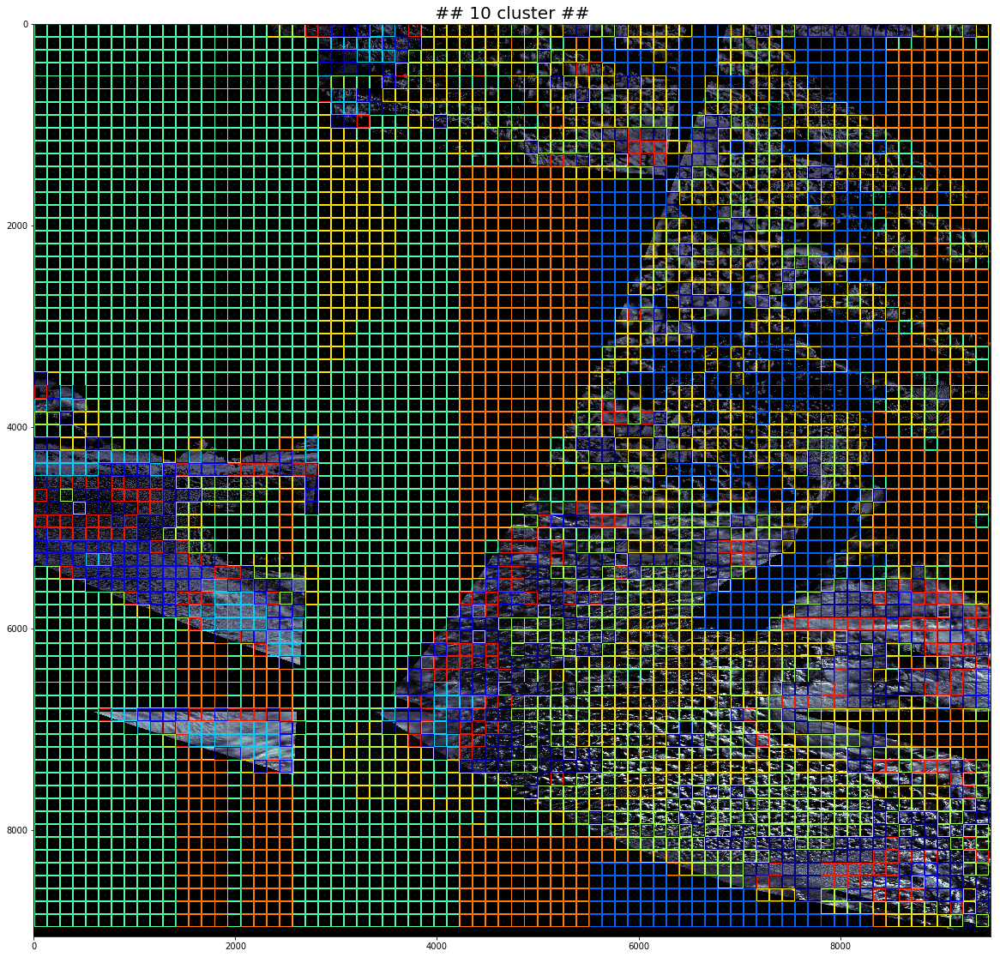

 
### Scaler : 1/40 ###


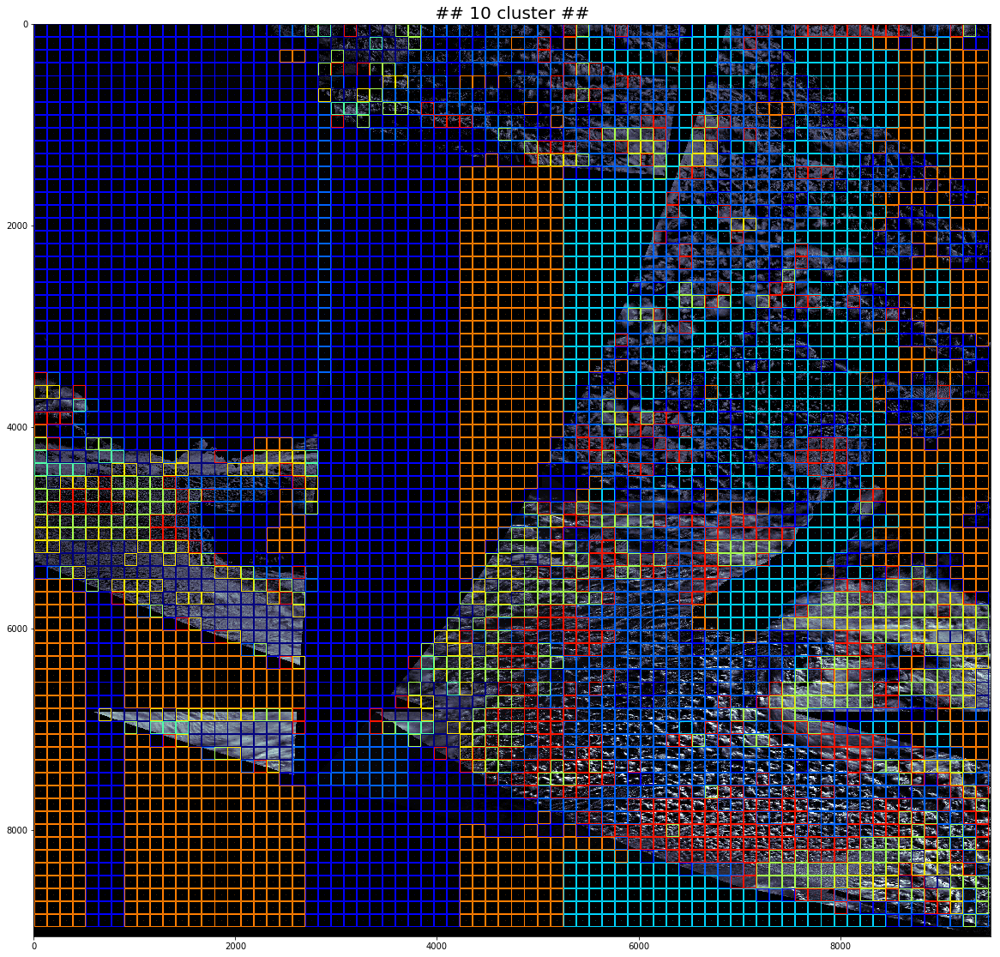

 
### Scaler : 1/45 ###


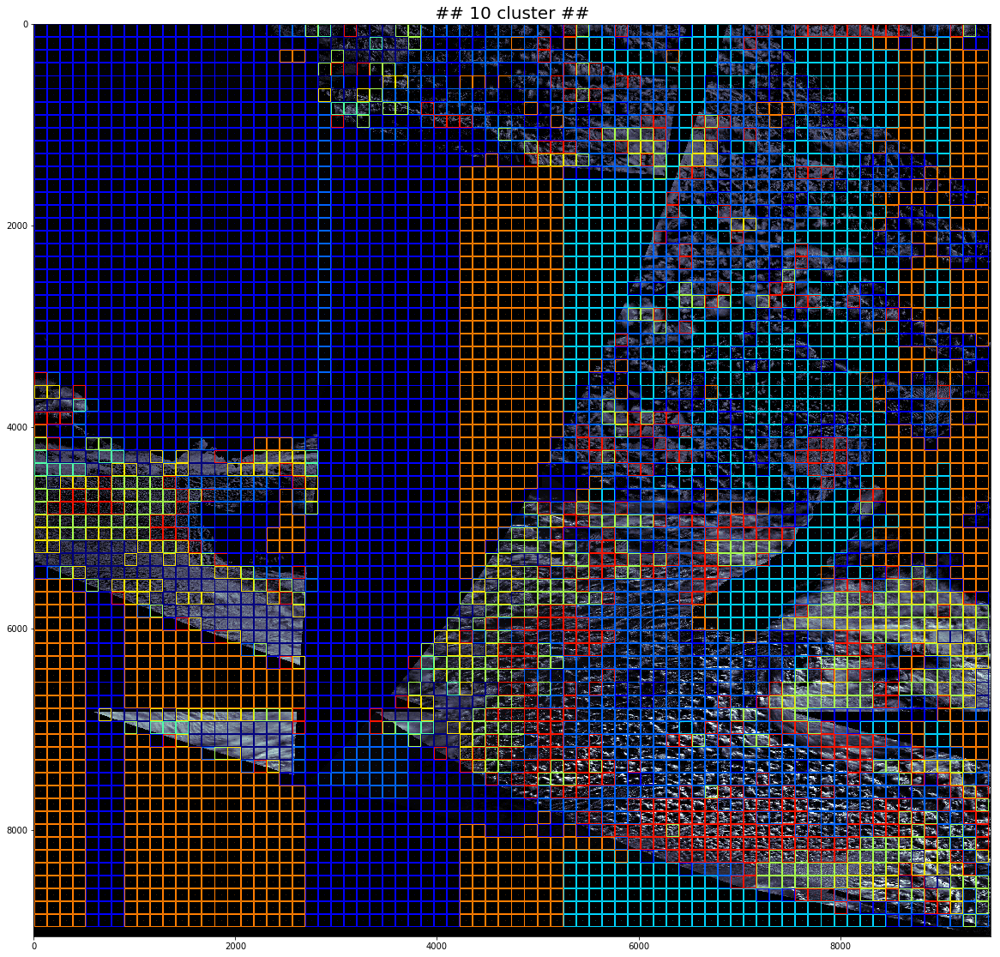

In [13]:
for i in range(25,50, 5):
    print(" ")
    print("### Scaler : 1/%d ###" % i)
    knn_label = np.load(datadir+'/'+'knn_label_'+str(i)+'.npy')
    _cluster_plotting(swath1, patches, knn_label, SHAPE, colors, ncluster=10)

 
### Scaler : 1/50 ###


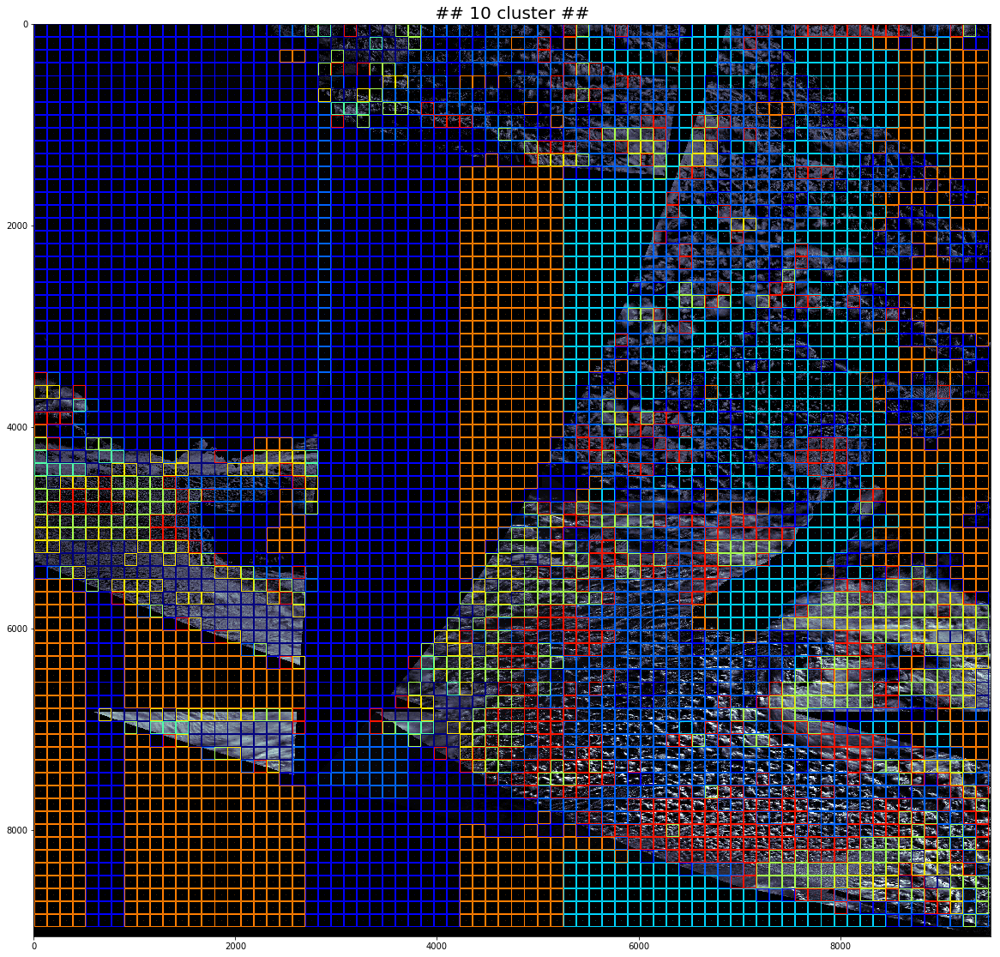

In [14]:
for i in [50]:
    print(" ")
    print("### Scaler : 1/%d ###" % i)
    knn_label = np.load(datadir+'/'+'knn_label_'+str(i)+'.npy')
    _cluster_plotting(swath1, patches, knn_label, SHAPE, colors, ncluster=10)

### larger than 50 scaler value cases

 
### Scaler : 1/60 ###


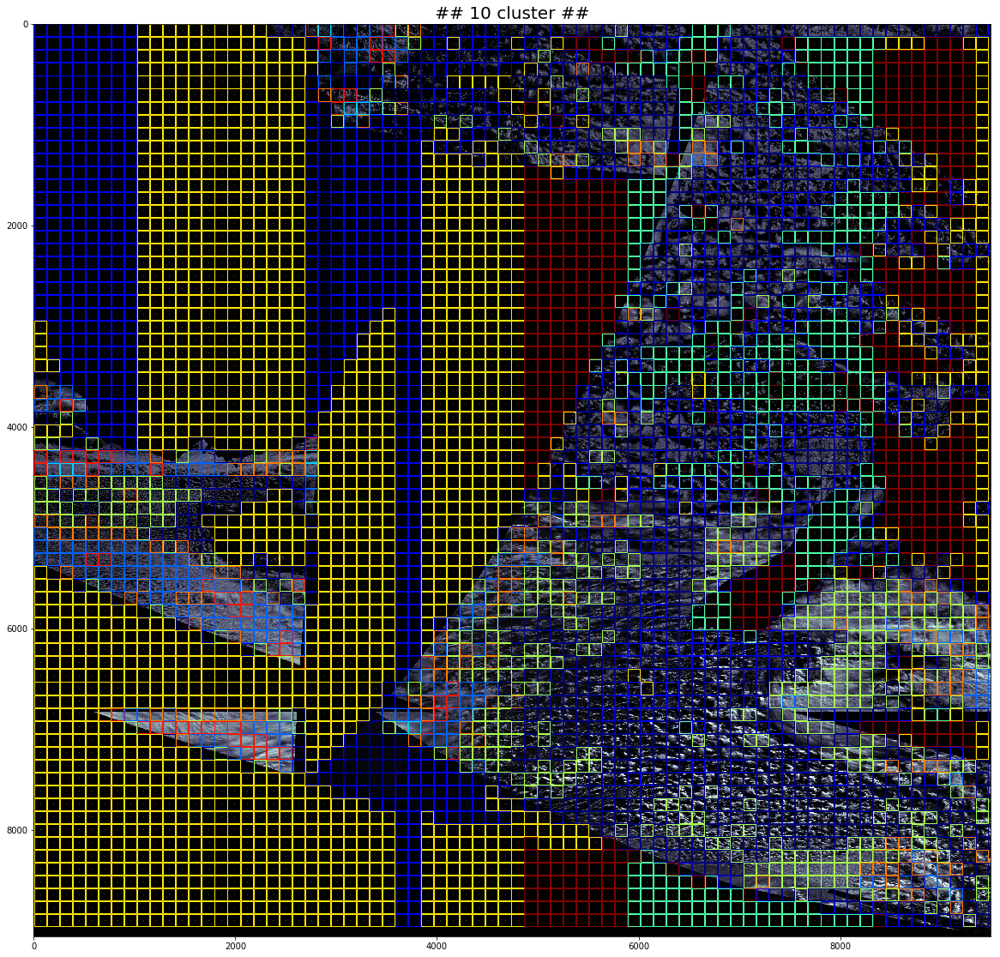

 
### Scaler : 1/80 ###


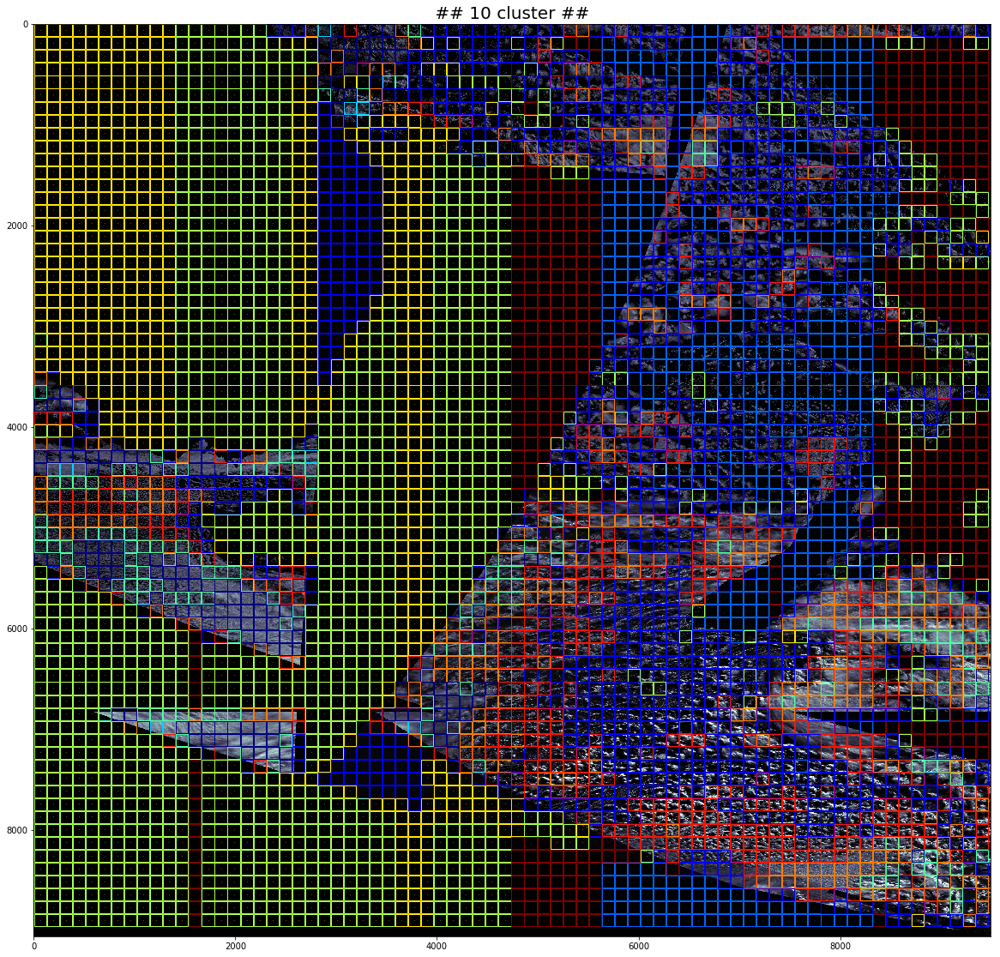

 
### Scaler : 1/100 ###


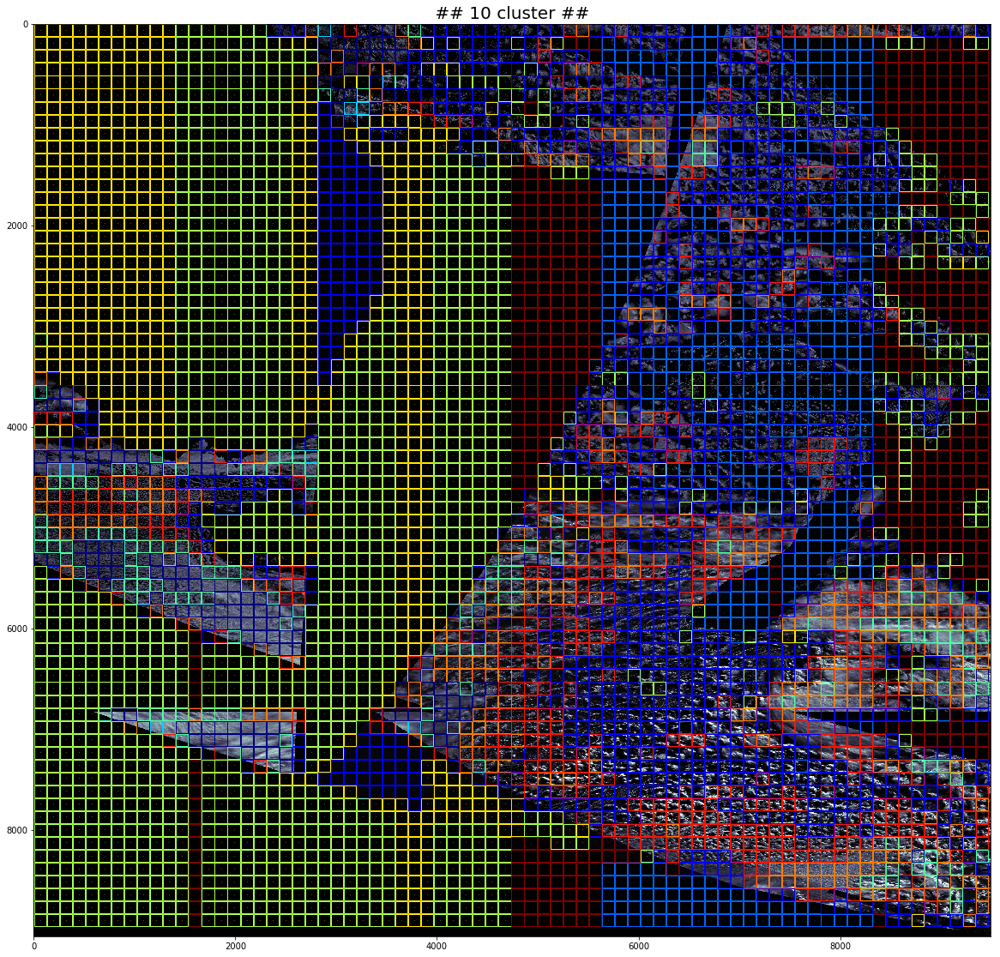

In [78]:
for i in [60,80,100]:
    print(" ")
    print("### Scaler : 1/%d ###" % i)
    knn_label = np.load(datadir+'/labels_knn_2015June/'+'knn_label_'+str(i)+'.npy')
    _cluster_plotting(swath1, patches, knn_label, SHAPE, colors, ncluster=10)

### AMI Score

base case: scaler== 25; All-Data (July 2015 3M patches)/25

In [30]:
base_labels = np.load(datadir+'/'+'knn_label_25.npy')
amis = []
for i in range(50, 25, -5):
    knn_labels = np.load(datadir+'/'+'knn_label_'+str(i)+'.npy')
    amis += [ ami(base_labels.flatten() , knn_labels.flatten() ) ]

In [31]:
amis

[0.698806739934859,
 0.698806739934859,
 0.698806739934859,
 0.6707511997308335,
 0.5992632308456333]

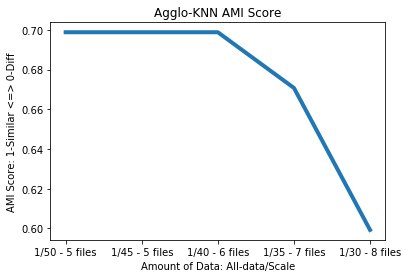

In [38]:
plt.figure()
x = [i for i in range(len([j for j in range(50, 25, -5)]))]
plt.plot(x,amis, linewidth=4)
_xlabel=[ '1/'+str(i)+' - '+str(j)+' files' for i, j in zip ( range(50,25,-5), [5,5,6,7,8])] 
plt.xticks(x,_xlabel )

#label
plt.xlabel("Amount of Data: All-data/Scale")
plt.ylabel("AMI Score: 1-Similar <=> 0-Diff")
plt.title("Agglo-KNN AMI Score")

plt.show()

### Extend: from 1/25-1/100 

In [40]:
base_labels = np.load(datadir+'/'+'knn_label_25.npy')
amis = []
for i in range(100, 25, -5):
    knn_labels = np.load(datadir+'/'+'knn_label_'+str(i)+'.npy')
    amis += [ ami(base_labels.flatten() , knn_labels.flatten() ) ]

In [41]:
amis

[0.6082920944030125,
 0.6082920944030125,
 0.6082920944030125,
 0.6082920944030125,
 0.6082920944030125,
 0.6082920944030125,
 0.6082920944030125,
 0.6467249909879368,
 0.6467249909879368,
 0.6467249909879368,
 0.698806739934859,
 0.698806739934859,
 0.698806739934859,
 0.6707511997308335,
 0.5992632308456333]

In [42]:
nfile = 291

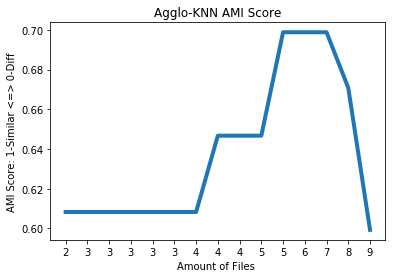

In [48]:
plt.figure()
x = [i for i in range(len([j for j in range(100, 25, -5)]))]
plt.plot(x,amis, linewidth=4)
#_xlabel=[ '1/'+str(i)+' - '+str(j)+' files' 
#             for i, j in zip ( range(100,25,-5), 
#                              [int(nfile/l) for l in range(100,25,-5)  ])] 
_xlabel=[ str(j) 
             for j in [int(nfile/l) for l in range(100,25,-5) ]  ]

plt.xticks(x,_xlabel )

#label
plt.xlabel("Amount of Files ")
plt.ylabel("AMI Score: 1-Similar <=> 0-Diff")
plt.title("Agglo-KNN AMI Score")

plt.show()

In [59]:
base_labels = np.load(datadir+'/'+'knn_label_25.npy')
amis = []
for i in [100, 80, 60, 40, 35, 30]:
    knn_labels = np.load(datadir+'/'+'knn_label_'+str(i)+'.npy')
    amis += [ ami(base_labels.flatten() , knn_labels.flatten() ) ]

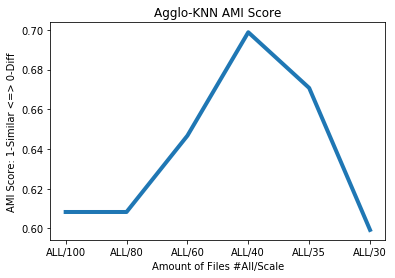

In [62]:
plt.figure()
_x = [100, 80, 60, 40, 35, 30]
x = [i for i in range(len(_x))]
plt.plot(x,amis, linewidth=4)
_xlabel=[ 'ALL/'+str(j)  for j in _x ]
plt.xticks(x, _xlabel )

#label
plt.xlabel("Amount of Files #All/Scale")
plt.ylabel("AMI Score: 1-Similar <=> 0-Diff")
plt.title("Agglo-KNN AMI Score")

plt.show()

In [80]:
for i in range(100,20, -5):
    _ss = np.load(datadir+'/sd_data/'+'sd_'+str(i)+'_patches_labels_2015July.npy')
    print(i, int(291/i) ); print(_ss.shape)

100 2
(14840,)
95 3
(14840,)
90 3
(14840,)
85 3
(14840,)
80 3
(14840,)
75 3
(14840,)
70 4
(14840,)
65 4
(24500,)
60 4
(24500,)
55 5
(24500,)
50 5
(34160,)
45 6
(34160,)
40 7
(34160,)
35 8
(44372,)
30 9
(54032,)
25 11
(78256,)


In [70]:
#sd_25_patches_labels_2015July.npy
array_shapes = []
for i in [100, 80, 60, 40, 35, 30]:
    _a = np.load(datadir+'/sd_data/'+'sd_'+str(i)+'_patches_labels_2015July.npy')
    print(_a.shape)
    array_shapes += [_a.shape[0]]

(14840,)
(14840,)
(24500,)
(34160,)
(44372,)
(54032,)


In [71]:
array_shapes[0]

14840

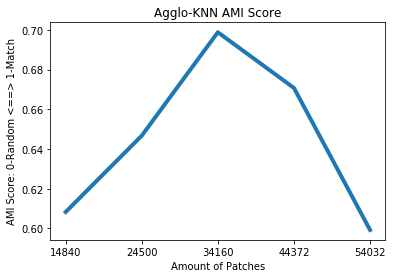

In [77]:
plt.figure()
_x = [80, 60, 40, 35, 30]
x = [i for i in range(len(_x))]
plt.plot(x,amis[1:], linewidth=4)
#_xlabel=[ 'ALL/'+str(j)  for j in _x ]
plt.xticks(x, array_shapes[1:] )

#label
plt.xlabel("Amount of Patches")
plt.ylabel("AMI Score: 0-Random <==> 1-Match")
plt.title("Agglo-KNN AMI Score")

plt.show()